Animations of depth of density = ~1023.3 during wind events with vwinds >= 5 m/s. 

In [2]:
import netCDF4 as nc
import numpy as np
import xarray as xr
from salishsea_tools import nc_tools, viz_tools, grid_tools, geo_tools
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy.signal as signal
from matplotlib import animation, rc
%matplotlib inline

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))

In [3]:
rc('animation', html='html5')

In [32]:
nemo_ji = np.array([(400, 25), (350,35), (300,40), (240,120), (250,50), (200,120), (150,150), 
                    (100,170), (50,180)]) + (335,115)
def calc_rho(Sal, TempC, P):
    sqrSal = np.sqrt(Sal)
    R1 = ((((6.536332e-9 * TempC - 1.120083e-6) * TempC + 1.001685e-4)
           * TempC - 9.095290e-3) * TempC + 6.793952e-2) * TempC - 28.263737
    R2 = (((5.3875e-9 * TempC - 8.2467e-7) * TempC + 7.6438e-5)
          * TempC - 4.0899e-3) * TempC + 8.24493e-1
    R3 = (-1.6546e-6 * TempC + 1.0227e-4) * TempC - 5.72466e-3
    SIG = (4.8314e-4 * Sal + R3 * sqrSal + R2) * Sal + R1
    V350P = 1.0 / 1028.1063
    SVA   = -SIG * V350P / (1028.1063 + SIG)
    rho = 28.106331 - SVA / (V350P * (V350P + SVA)) + 1000
    return rho

In [8]:
grid = xr.open_dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/bathymetry_201702.nc')
atmos_grid = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSaAtmosphereGridV1')
winds_data = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSaSurfaceAtmosphereFieldsV1')
hindcast = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSn3DTracerFields1hV16-10')
mesh_mask = nc.Dataset('/data/vdo/MEOPAR/NEMO-forcing/grid/mesh_mask201702.nc')

In [10]:
pa = xr.open_dataset('https://salishsea.eos.ubc.ca/erddap/griddap/ubcSSnPointAtkinsonSSH10mV16-10')
pa_ssh = pa.ssh.sel(time=slice('2016-10-15 12:00:00', '2017-07-01 12:00:00'))

In [11]:
def animate_nowcast(time_slice2, rho):
    x_slice = slice(115, 365)
    y_slice = slice(335, 785)
    sal2 = (hindcast.salinity
        .isel( gridX=x_slice, gridY=y_slice)
        .sel(time=time_slice2))
    temp2 = (hindcast.temperature
         .isel(gridX = x_slice, gridY = y_slice)
         .sel(time=time_slice2))
    sal_values2 = sal2.values
    temp_values2 = temp2.values
    depth = hindcast.depth.values
    density1 = calc_rho(sal_values2, temp_values2, depth[np.newaxis,:,np.newaxis, np.newaxis])
    index1 = (np.abs(density1 - rho)).argmin(axis=1)
    time, zshape, yshape, xshape = sal_values2.shape
    list_of_depths1 = np.zeros((time,450,250))
    for t in range(time):
        for y in range(450):
            for x in range(250):
                list_of_depths1[t,y,x] = depth[index1[t,y,x]]
    N = 1
    Wn = 1/24
    B, A = signal.butter(N,Wn)
    vwinds2 = np.zeros((9,time+1))
    i=0
    for point in nemo_ji:
        nemo_lon = grid.nav_lon.isel(y=point[0], x=point[1])
        nemo_lat = grid.nav_lat.isel(y=point[0], x=point[1])
        nemo_lon_lat = (np.asscalar(nemo_lon.values), np.asscalar(nemo_lat))
        atmos_ji = geo_tools.find_closest_model_point(
            nemo_lon_lat[0], nemo_lon_lat[1],
            atmos_grid.longitude.values - 360, atmos_grid.latitude.values,
            grid = "GEM2.5")
        u_wind_ts = (winds_data.u_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice2))
        v_wind_ts = (winds_data.v_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice2))
        rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                       v_wind_ts.values, origin = 'map' )
        windfu = signal.filtfilt(B,A, rotated_u_winds)
        windfv = signal.filtfilt(B,A,rotated_v_winds)
        vwinds2[i]=windfv
        i = i + 1
    mask_land = 1 - mesh_mask.variables['tmask'][0,0,335:785,115:365]
    fig,ax = plt.subplots(2,1,figsize=(8,8))
    colours = cm.jet(np.linspace(0,1,9))
    def animate30(i):
        ax[0].clear()
        ax[1].clear()
        for p, colour in zip(range(9), colours):
            ax[0].plot(range(time+1), vwinds2[p], color = colour)
        ax[0].plot((i, i), (-5,15), 'b--', color = 'black')
        ax[0].set_ylim(-5,15)
        ax[0].grid('on')
        masked_depths1 = np.ma.masked_array(list_of_depths1[i,:,:], mask = mask_land)
        ax[1].contourf(masked_depths1, 
                      levels = np.linspace(0, 80, 8))
        ax[1].set_title('hour = %03d'%(i)) 
        return ax

    interval = 0.25#in seconds
    ani40 = animation.FuncAnimation(fig,animate30,frames=time,interval=interval*1e+3, repeat=False)
    return ani40

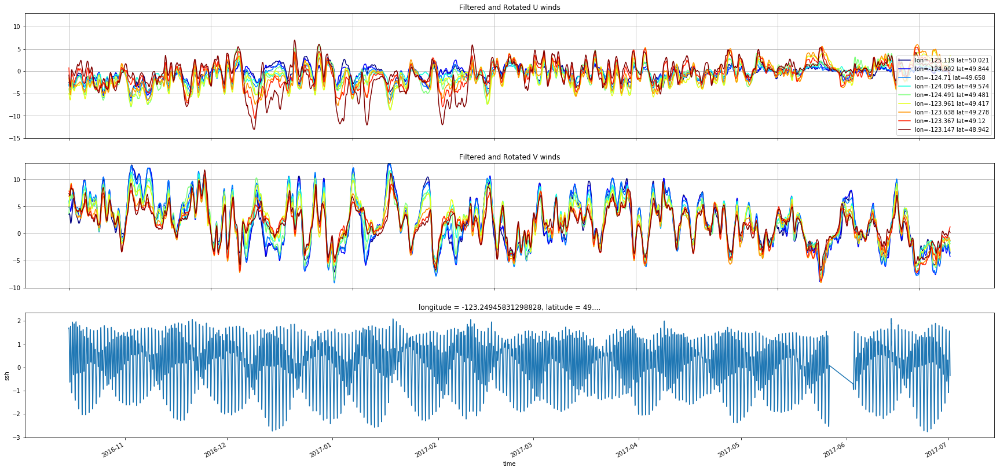

In [12]:
time_slice = slice('2016-10-15 12:00:00', '2017-07-01 12:00:00')
N = 1
Wn = 1/24
B, A = signal.butter(N,Wn)
colours = cm.jet(np.linspace(0,1,9))
fig,axs = plt.subplots(3,1, figsize=(30,15))
for point, colour in zip(nemo_ji, colours):
    nemo_lon = grid.nav_lon.isel(y=point[0], x=point[1])
    nemo_lat = grid.nav_lat.isel(y=point[0], x=point[1])
    nemo_lon_lat = (np.asscalar(nemo_lon.values), np.asscalar(nemo_lat))
    atmos_ji = geo_tools.find_closest_model_point(
        nemo_lon_lat[0], nemo_lon_lat[1],
        atmos_grid.longitude.values - 360, atmos_grid.latitude.values,
        grid = "GEM2.5")
    u_wind_ts = (winds_data.u_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
    v_wind_ts = (winds_data.v_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
    rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                       v_wind_ts.values, origin = 'map' )
    windfu = signal.filtfilt(B,A, rotated_u_winds)
    windfv = signal.filtfilt(B,A,rotated_v_winds)
    axs[0].plot(range(6217), windfu, color = colour, label = 'lon='+
                str(np.round(nemo_lon_lat[0],3))
                +" lat="+str(np.round(nemo_lon_lat[1],3)))
    axs[0].set_title('Filtered and Rotated U winds')
    axs[1].plot(range(6217), windfv, color = colour, label = 'lon='+
                str(np.round(nemo_lon_lat[0],3))
                +" lat="+str(np.round(nemo_lon_lat[1],3))) 
    axs[1].set_title('Filtered and Rotated V winds')
pa_ssh.plot(ax=axs[2])
axs[0].legend(loc = 'lower right')
axs[0].set_ylim(-15,13)
axs[1].set_ylim(-10,13)
axs[0].grid()
axs[1].grid()

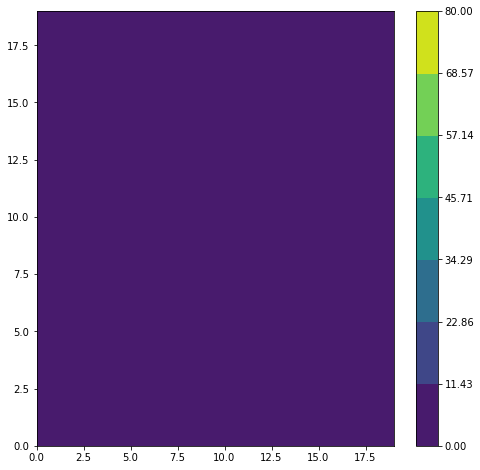

In [13]:
fig,ax = plt.subplots(figsize=(8,8))
den = ax.contourf(np.ones((20,20)), levels = np.linspace(0, 80, 8))
fig.colorbar(den, ax=ax)

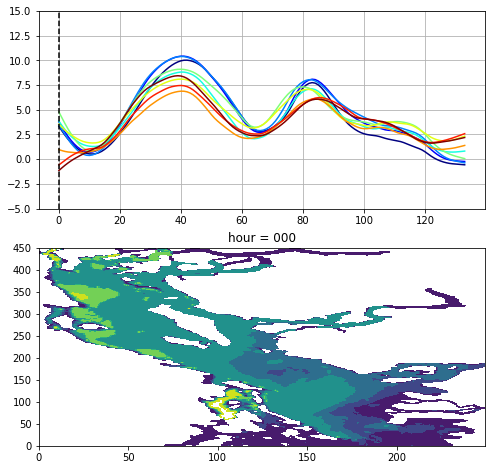

In [14]:
animate_nowcast(slice('2016-10-23 23:00:00', '2016-10-29 12:00:00'), 1023.3)

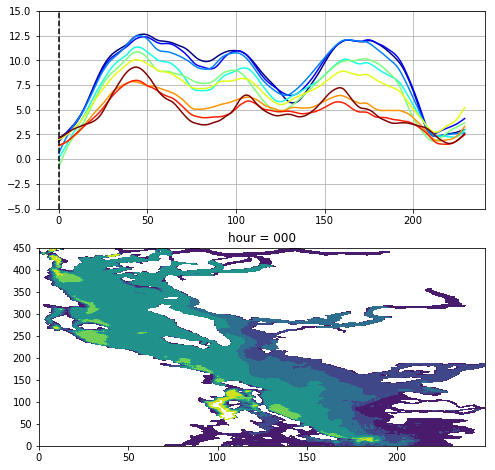

In [15]:
animate_nowcast(slice('2016-10-31 23:00:00', '2016-11-10 12:00:00'), 1023.3)

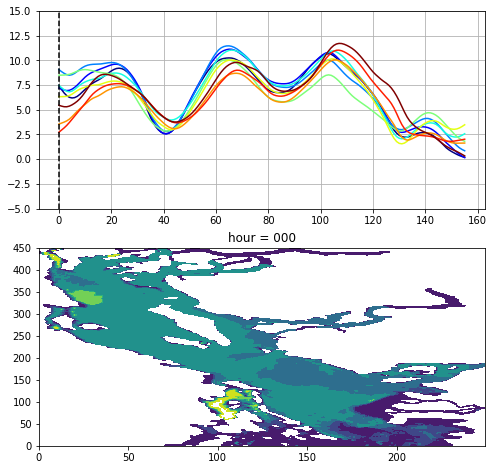

In [16]:
animate_nowcast(slice('2016-11-19 22:00:00', '2016-11-26 09:00:00'), 1023.3)

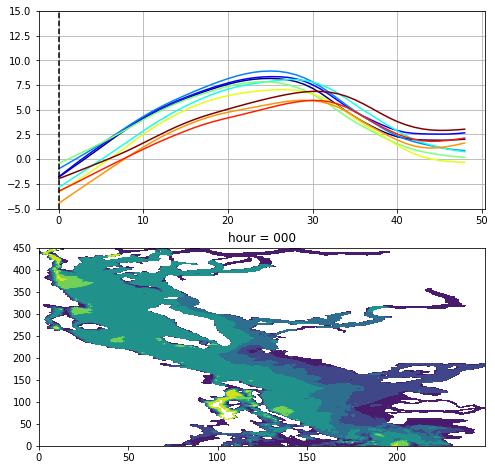

In [17]:
animate_nowcast(slice('2016-12-01 12:00:00', '2016-12-03 12:00:00'), 1023.3)

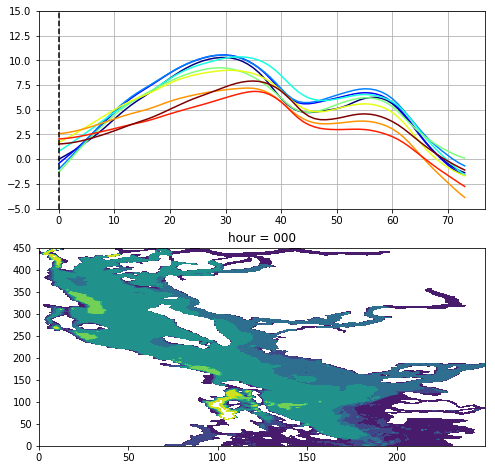

In [18]:
animate_nowcast(slice('2016-12-17 22:00:00', '2016-12-20 23:00:00'), 1023.3)

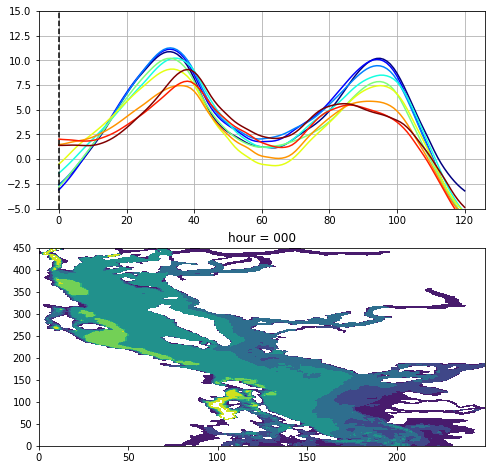

In [19]:
animate_nowcast(slice('2016-12-25 12:00:00', '2016-12-30 12:00:00'), 1023.3)

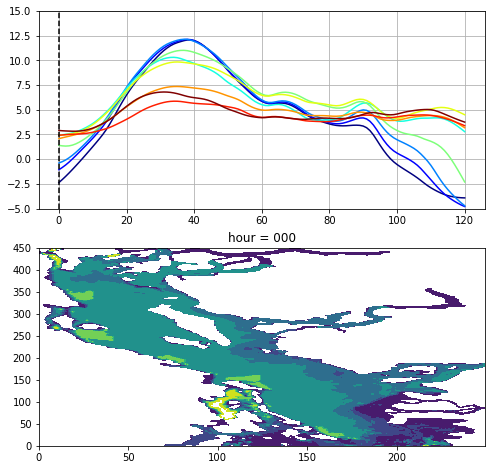

In [20]:
animate_nowcast(slice('2017-01-05 12:00:00', '2017-01-10 12:00:00'), 1023.3)

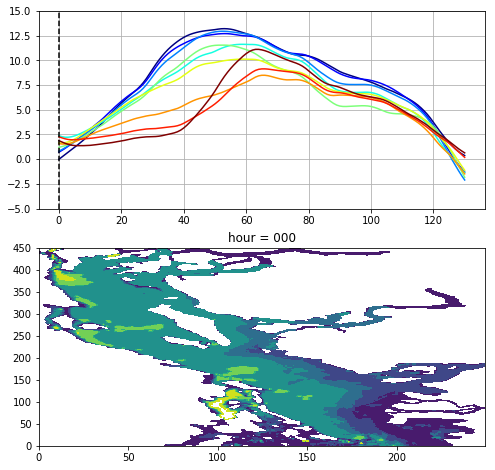

In [21]:
animate_nowcast(slice('2017-01-15 12:00:00', '2017-01-20 22:00:00'), 1023.3)

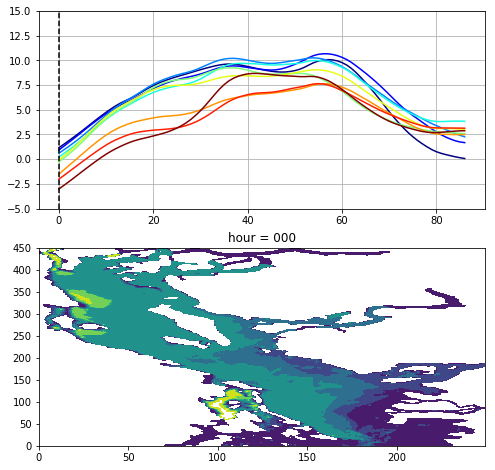

In [22]:
animate_nowcast(slice('2017-02-13 22:00:00', '2017-02-17 12:00:00'), 1023.3)

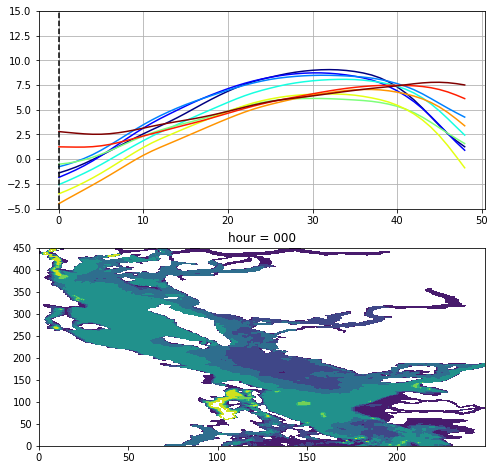

In [23]:
animate_nowcast(slice('2017-03-01 12:00:00', '2017-03-03 12:00:00'), 1023.3)

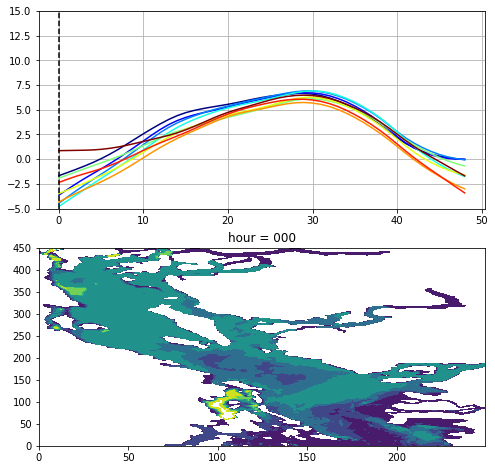

In [24]:
animate_nowcast(slice('2017-03-06 12:00:00', '2017-03-08 12:00:00'), 1023.3)

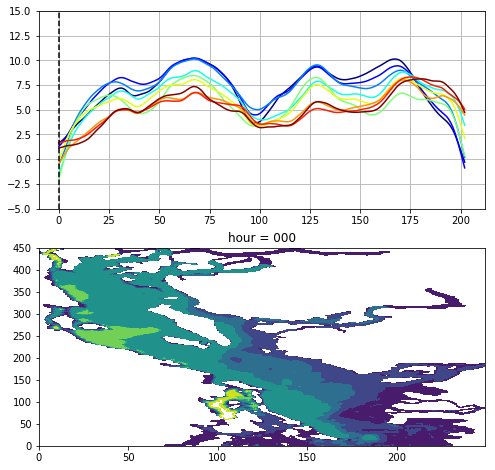

In [25]:
animate_nowcast(slice('2017-03-21 12:00:00', '2017-03-29 22:00:00'), 1023.3)

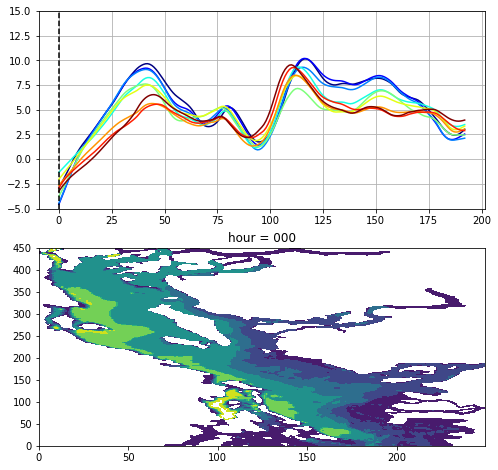

In [26]:
animate_nowcast(slice('2017-04-03 12:00:00', '2017-04-11 12:00:00'), 1023.3)

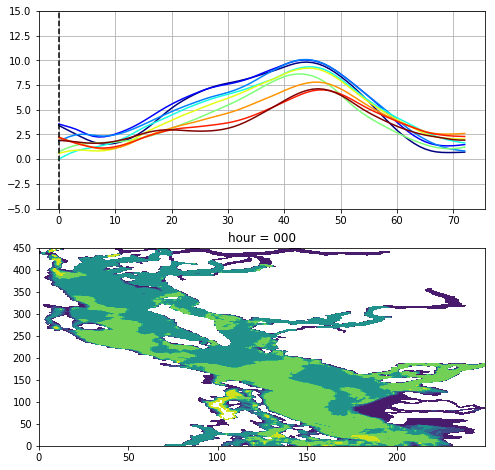

In [27]:
animate_nowcast(slice('2017-06-13 23:00:00', '2017-06-16 23:00:00'), 1023.3)

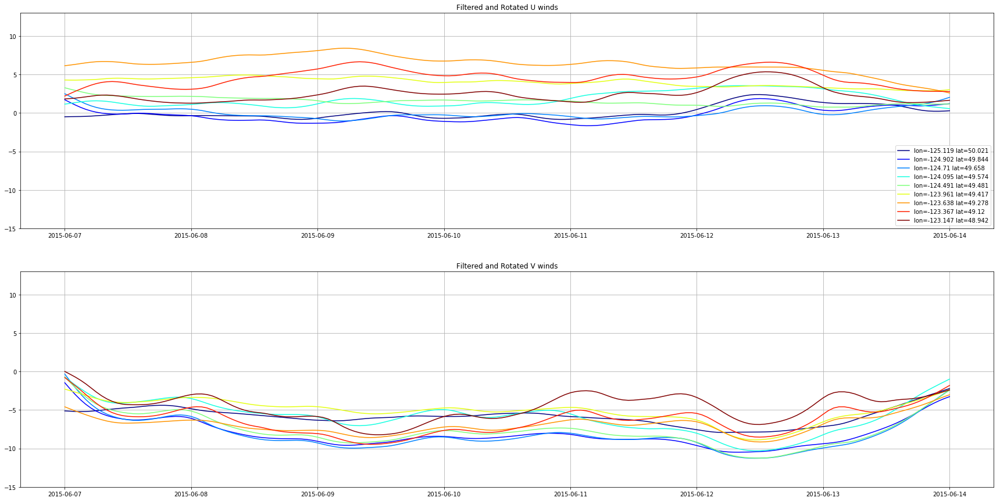

In [39]:
time_slice = slice('2015-06-07 00:00:00', '2015-06-14 00:00:00')
N = 1
Wn = 1/24
B, A = signal.butter(N,Wn)
colours = cm.jet(np.linspace(0,1,9))
fig,axs = plt.subplots(2,1, figsize=(30,15))
for point, colour in zip(nemo_ji, colours):
    nemo_lon = grid.nav_lon.isel(y=point[0], x=point[1])
    nemo_lat = grid.nav_lat.isel(y=point[0], x=point[1])
    nemo_lon_lat = (np.asscalar(nemo_lon.values), np.asscalar(nemo_lat))
    atmos_ji = geo_tools.find_closest_model_point(
        nemo_lon_lat[0], nemo_lon_lat[1],
        atmos_grid.longitude.values - 360, atmos_grid.latitude.values,
        grid = "GEM2.5")
    u_wind_ts = (winds_data.u_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
    v_wind_ts = (winds_data.v_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
    rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                       v_wind_ts.values, origin = 'map' )
    windfu = signal.filtfilt(B,A, rotated_u_winds)
    windfv = signal.filtfilt(B,A,rotated_v_winds)
    axs[0].plot(winds_data.time.sel(time=time_slice), windfu, color = colour, label = 'lon='+
                str(np.round(nemo_lon_lat[0],3))
                +" lat="+str(np.round(nemo_lon_lat[1],3)))
    axs[0].set_title('Filtered and Rotated U winds')
    axs[1].plot(winds_data.time.sel(time=time_slice), windfv, color = colour, label = 'lon='+
                str(np.round(nemo_lon_lat[0],3))
                +" lat="+str(np.round(nemo_lon_lat[1],3))) 
    axs[1].set_title('Filtered and Rotated V winds')
axs[0].legend(loc = 'lower right')
axs[0].set_ylim(-15,13)
axs[1].set_ylim(-15,13)
axs[0].grid()
axs[1].grid()

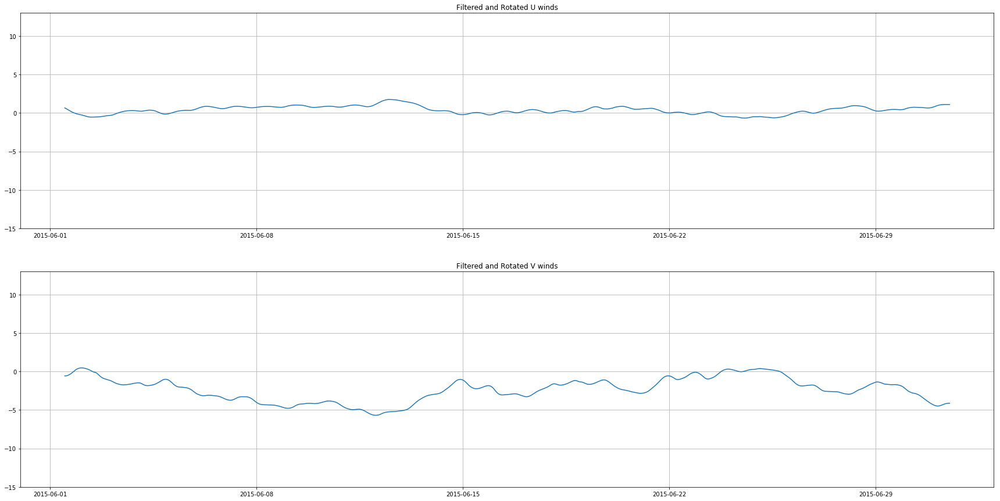

In [31]:
time_slice = slice('2015-06-01 12:00:00', '2015-07-01 12:00:00')
N = 1
Wn = 1/24
B, A = signal.butter(N,Wn)
colours = cm.jet(np.linspace(0,1,9))
fig,axs = plt.subplots(2,1, figsize=(30,15))

nemo_lon = grid.nav_lon.isel(y=761, x=137)
nemo_lat = grid.nav_lat.isel(y=761, x=137)
nemo_lon_lat = (np.asscalar(nemo_lon.values), np.asscalar(nemo_lat))
atmos_ji = geo_tools.find_closest_model_point(
        nemo_lon_lat[0], nemo_lon_lat[1],
        atmos_grid.longitude.values - 360, atmos_grid.latitude.values,
        grid = "GEM2.5")
u_wind_ts = (winds_data.u_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
v_wind_ts = (winds_data.v_wind
                 .isel(gridY=atmos_ji[0], gridX=atmos_ji[1])
                 .sel(time=time_slice))
rotated_u_winds, rotated_v_winds = viz_tools.rotate_vel(u_wind_ts.values, 
                                                       v_wind_ts.values, origin = 'map' )
windfu = signal.filtfilt(B,A, rotated_u_winds)
windfv = signal.filtfilt(B,A,rotated_v_winds)
axs[0].plot(winds_data.time.sel(time=time_slice), windfu)
axs[0].set_title('Filtered and Rotated U winds')
axs[1].plot(winds_data.time.sel(time=time_slice), windfv) 
axs[1].set_title('Filtered and Rotated V winds')
axs[0].set_ylim(-15,13)
axs[1].set_ylim(-15,13)
axs[0].grid()
axs[1].grid()

Too many things (tides, etc) interfering to really see upwelling signals. Able to see it in some but mostly too noisy. 